## Display lung segmentation mask of a CT scan (or comparison with ground truth mask)

In [1]:
import os
import SimpleITK as sitk
import matplotlib.pyplot as plt
from skimage import measure
from scipy.ndimage import morphology
%matplotlib inline

In [2]:
# NOTEBOOK VARS. Set through environment variable or manually here.
SIDE_BY_SIDE_COMPARISON = bool(os.environ.get("MASK_FILE",
    True  # Just put False if you don't want to compare the predictions to the original mask
))
INPUTS="/mnt/Data/LUNA/dataset/subset0"
OUTPUTS="/mnt/Data/predicted_lung_masks"
MASKS = "/mnt/Data/LUNA/seg-lungs-LUNA16"

CT_SCAN_FILE = os.environ.get("CT_SCAN_FILE",
    INPUTS + "/1.3.6.1.4.1.14519.5.2.1.6279.6001.109002525524522225658609808059.mhd"
)
MASK_FILE = os.environ.get("MASK_FILE",
    MASKS + "/1.3.6.1.4.1.14519.5.2.1.6279.6001.109002525524522225658609808059.mhd"
)
PRED_MASK_FILE = os.environ.get("PRED_MASK_FILE",
    OUTPUTS + "/1.3.6.1.4.1.14519.5.2.1.6279.6001.109002525524522225658609808059.nii.gz"
)


In [3]:
img = sitk.ReadImage(CT_SCAN_FILE)
img_arr = sitk.GetArrayFromImage(img)

if SIDE_BY_SIDE_COMPARISON:
    mask = sitk.ReadImage(MASK_FILE)
    mask_arr = sitk.GetArrayFromImage(mask)
    mask_arr = morphology.binary_fill_holes(mask_arr)

pred_mask = sitk.ReadImage(PRED_MASK_FILE)
pred_mask_arr = sitk.GetArrayFromImage(pred_mask)
pred_mask_arr = morphology.binary_fill_holes(pred_mask_arr)

def draw_masked_scan(ax, mask_arr, color='b'):
    lung_contours = measure.find_contours(mask_arr, 0.5)
    for contour in lung_contours:
        ax.plot(contour[:, 1], contour[:, 0], linewidth=1, color=color, alpha=0.9)

blue represents the ground truth mask loaded by MASK_FILE
red represents the predicted lung mask loade by PRED_MASK_FILE


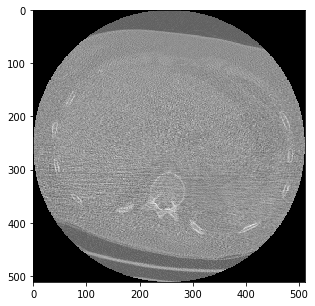

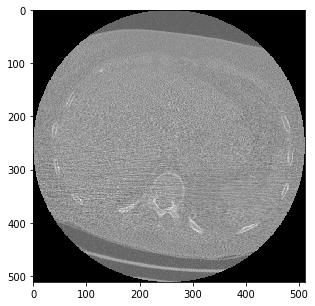

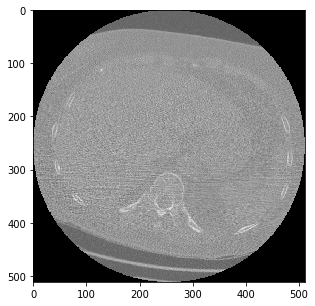

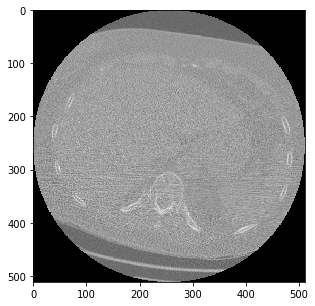

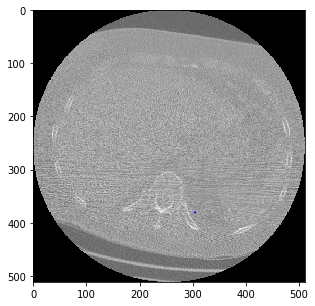

...

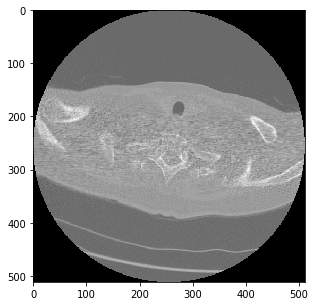

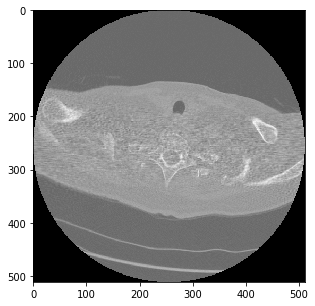

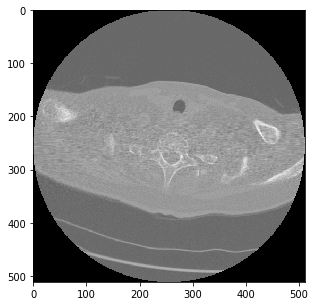

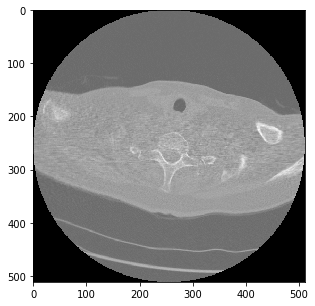

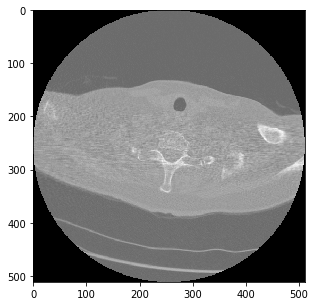

In [4]:
print("blue represents the ground truth mask loaded by MASK_FILE")
print("red represents the predicted lung mask loade by PRED_MASK_FILE")
for z in range(img_arr.shape[0]):
    f, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(img_arr[z], cmap="gray")
    if SIDE_BY_SIDE_COMPARISON:
        draw_masked_scan(ax, mask_arr[z], color='b')
    draw_masked_scan(ax, pred_mask_arr[z], color='r')
    plt.show()